# Keras

## 1. Primeira rede neural usando o keras.

<div>
<img src="imagens/artificial.jpg" width="300"
</div>

LearnDataSci, CC BY-SA 4.0 <https://creativecommons.org/licenses/by-sa/4.0>, via Wikimedia Commons

Criando a rede neural acima. Vamos chamá-la de **modelo A**:

In [57]:
from keras.models import Sequential
from keras.layers import Dense, Activation

modeloA = Sequential([
    Dense(5, input_shape=(3,), activation='relu'),
    Dense(2, activation='softmax')
])

Uma outra forma de especificar a função Sequential:

In [46]:
modeloA = Sequential()
modeloA.add(Dense(5, input_shape=(3,)))
modeloA.add(Activation('relu'))
modeloA.add(Dense(2))
modeloA.add(Activation('softmax'))

## 2. Gerando e processando um conjunto de dados

Importando as bibliotecas:

In [90]:
import numpy as np
from random import randint
from sklearn.preprocessing import MinMaxScaler

Criando dados:
 - Um remédio foi testado em um conjunto de 2100 pessoas, metade com mais de 65 anos e metade com menos
 - 95% das pessoas com menos de 65 anos *não* apresentou efeitos colaterais
 - 95% das pessoas com mais de 65 anos apresentou efeitos colaterais


In [111]:
treino_labels = []
treino_amostras = []

for i in range(1000):
    jovem_random = randint(13,64)
    treino_amostras.append(jovem_random)
    treino_labels.append(0)

    idoso_random = randint(65,100)
    treino_amostras.append(idoso_random)
    treino_labels.append(1)

for i in range(50):
    jovem_random = randint(13,64)
    treino_amostras.append(jovem_random)
    treino_labels.append(1)

    idoso_random = randint(65,100)
    treino_amostras.append(idoso_random)
    treino_labels.append(0)

treino_amostras = np.array(treino_amostras)
treino_labels = np.array(treino_labels)

Reescalando os dados colocando-os na faixa de 0 à 1 e deixando no formato apropriado para o keras:

In [112]:
reescala = MinMaxScaler(feature_range=(0,1))
treino_amostras_reescala = reescala.fit_transform((treino_amostras).reshape(-1,1))

## 3. Criando e treinando um modelo

Vamos criar um novo modelo chamado de **modelo B** para prever se efeitos colaterais vão acontecer:

In [100]:
import keras
from keras import backend as K
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy

In [124]:
modeloB = Sequential([
    Dense(16, input_shape=(1,), activation='relu'),
    Dense(32, activation='relu'),
    Dense(2, activation='sigmoid')
])

Compilando o modelo B:

In [125]:
modeloB.compile(Adam(lr=.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

Treinando:

In [118]:
#batch_size - lote de dados
#shuffle - embaralhamento
#verbose - saídas (outputs)
modeloB.fit(treino_amostras_reescala, treino_labels, batch_size=10, epochs=20, shuffle=True, verbose=2)

Epoch 1/20
210/210 - 1s - loss: 0.7174 - accuracy: 0.4933
Epoch 2/20
210/210 - 0s - loss: 0.6757 - accuracy: 0.7714
Epoch 3/20
210/210 - 0s - loss: 0.6399 - accuracy: 0.8381
Epoch 4/20
210/210 - 0s - loss: 0.6076 - accuracy: 0.8343
Epoch 5/20
210/210 - 0s - loss: 0.5759 - accuracy: 0.8419
Epoch 6/20
210/210 - 0s - loss: 0.5466 - accuracy: 0.8590
Epoch 7/20
210/210 - 0s - loss: 0.5186 - accuracy: 0.8643
Epoch 8/20
210/210 - 0s - loss: 0.4912 - accuracy: 0.8771
Epoch 9/20
210/210 - 0s - loss: 0.4647 - accuracy: 0.8757
Epoch 10/20
210/210 - 0s - loss: 0.4401 - accuracy: 0.8952
Epoch 11/20
210/210 - 0s - loss: 0.4179 - accuracy: 0.8976
Epoch 12/20
210/210 - 0s - loss: 0.3979 - accuracy: 0.9005
Epoch 13/20
210/210 - 0s - loss: 0.3806 - accuracy: 0.9076
Epoch 14/20
210/210 - 0s - loss: 0.3653 - accuracy: 0.9076
Epoch 15/20
210/210 - 0s - loss: 0.3523 - accuracy: 0.9129
Epoch 16/20
210/210 - 0s - loss: 0.3411 - accuracy: 0.9157
Epoch 17/20
210/210 - 0s - loss: 0.3316 - accuracy: 0.9205
Epoch 

Caso ache necessário especificar uma parcela dos dados para validação (20% no exemplo):

In [126]:
#validation_split - 20% dos dados para validação
modeloB.fit(treino_amostras_reescala, treino_labels, validation_split=0.30, batch_size=10, epochs=20, shuffle=True, verbose=2)

Epoch 1/20
147/147 - 1s - loss: 0.6437 - accuracy: 0.5238 - val_loss: 0.6547 - val_accuracy: 0.5444
Epoch 2/20
147/147 - 0s - loss: 0.6252 - accuracy: 0.5612 - val_loss: 0.6429 - val_accuracy: 0.5810
Epoch 3/20
147/147 - 0s - loss: 0.6019 - accuracy: 0.6272 - val_loss: 0.6266 - val_accuracy: 0.6381
Epoch 4/20
147/147 - 0s - loss: 0.5759 - accuracy: 0.6891 - val_loss: 0.6114 - val_accuracy: 0.6698
Epoch 5/20
147/147 - 0s - loss: 0.5507 - accuracy: 0.7259 - val_loss: 0.5969 - val_accuracy: 0.6889
Epoch 6/20
147/147 - 0s - loss: 0.5252 - accuracy: 0.7605 - val_loss: 0.5825 - val_accuracy: 0.7190
Epoch 7/20
147/147 - 0s - loss: 0.4991 - accuracy: 0.7871 - val_loss: 0.5681 - val_accuracy: 0.7286
Epoch 8/20
147/147 - 0s - loss: 0.4729 - accuracy: 0.8109 - val_loss: 0.5545 - val_accuracy: 0.7333
Epoch 9/20
147/147 - 0s - loss: 0.4451 - accuracy: 0.8306 - val_loss: 0.5411 - val_accuracy: 0.7429
Epoch 10/20
147/147 - 0s - loss: 0.4179 - accuracy: 0.8558 - val_loss: 0.5287 - val_accuracy: 0.7603

Uma outra forma de criar uma lista de validação fora do conjunto de dados de treino:

In [ ]:
valid_set = [(amostra,label), (amostra,label), ..., (amostra,label)]
modeloB.fit(treino_amostras_reescala, treino_labels, validation_data=valid_set, batch_size=10, epochs=20, shuffle=True, verbose=2)

## 4. Fazendo uma predição com o modelo

In [127]:
teste_labels = []
teste_amostras = []

for i in range(1000):
    jovem_random = randint(13,64)
    teste_amostras.append(jovem_random)
    teste_labels.append(0)

    idoso_random = randint(65,100)
    teste_amostras.append(idoso_random)
    teste_labels.append(1)

for i in range(50):
    jovem_random = randint(13,64)
    teste_amostras.append(jovem_random)
    teste_labels.append(1)

    idoso_random = randint(65,100)
    teste_amostras.append(idoso_random)
    teste_labels.append(0)

teste_amostras = np.array(teste_amostras)
teste_labels = np.array(teste_labels)

In [128]:
reescala = MinMaxScaler(feature_range=(0,1))
teste_amostras_reescala = reescala.fit_transform((teste_amostras).reshape(-1,1))

In [137]:
predicao = modeloB.predict(teste_amostras_reescala, batch_size=10, verbose=1)

210/210 [==============================] - 0s 622us/step


In [138]:
for i in predicao:
  print(i)

0012]
[0.17718798 0.8372525 ]
[0.7503754 0.2116726]
[0.20551735 0.80673814]
[0.56272024 0.40141925]
[0.1839701 0.8300078]
[0.56272024 0.40141925]
[0.22888061 0.78112316]
[0.74946934 0.21225992]
[0.40382844 0.582209  ]
[0.50575316 0.46547017]
[0.24546182 0.76273584]
[0.55141026 0.41403437]
[0.13625109 0.87945974]
[0.75095737 0.21171981]
[0.2809795 0.7228745]
[0.7476506  0.21343815]
[0.24546182 0.76273584]
[0.74534774 0.21698692]
[0.25405046 0.753152  ]
[0.73931694 0.22053933]
[0.39284295 0.5948595 ]
[0.73267287 0.22757044]
[0.32950774 0.66764426]
[0.660326   0.29535064]
[0.19095165 0.82250893]
[0.7503754 0.2116726]
[0.32950774 0.66764426]
[0.6804836 0.2753175]
[0.27181232 0.7332174 ]
[0.58513457 0.37659144]
[0.37120384 0.61977124]
[0.73604345 0.223813  ]
[0.3500694 0.6440678]
[0.4828406  0.49153742]
[0.17060348 0.8442464 ]
[0.7425641  0.21730012]
[0.22089094 0.7899239 ]
[0.57396543 0.3889333 ]
[0.15201634 0.86376244]
[0.7476506  0.21343815]
[0.22089094 0.7899239 ]
[0.7349464 0.2249119]


## 5. Data augmentation

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import misc, ndimage
import keras
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
%matplotlib inline

Imprimir imagens na tela:

In [2]:
# plots images with labels within jupyter notebook
def plots(ims, figsize=(12,6), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')

In [39]:
gen = ImageDataGenerator(rotation_range=10, width_shift_range=0.1,
        height_shift_range=0.1, shear_range=0.15, zoom_range=0.1,
        channel_shift_range=10, horizontal_flip=True)

In [32]:
image_path = 'imagens/cachorro.jpg'

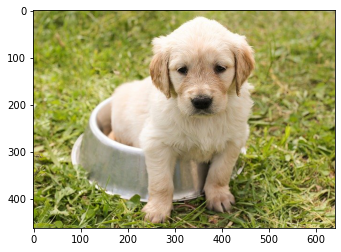

In [35]:
image = np.expand_dims(plt.imread(image_path), 0)
plt.imshow(image[0])

Gerando imagens modificadas (augmented)

In [40]:
aug_iter = gen.flow(image)

Obtendo 10 amostras dos dados "augmentados"

In [41]:
aug_images = [next(aug_iter)[0].astype(np.uint8) for i in range(16)]

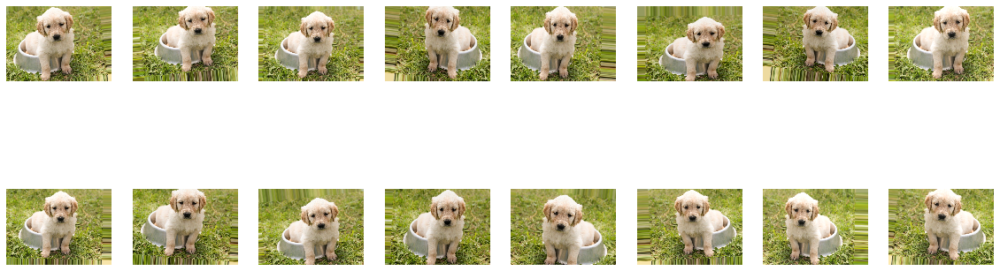

In [42]:
plots(aug_images, figsize=(20,7),rows=2)